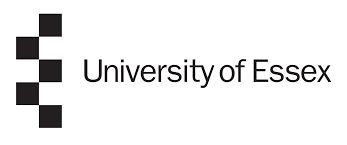


# **CE888-7-SP : Data Science and Decision Making**


##   Project: Stress Detection Using Eye Tracking Data
### INDIVIDUAL CW REPORT

### Student Name:     Sreenu Yamala
### Student Number:   2202520
### Topic : Empathy
### Module Leader:  Dr Ana Matran-Fernandez
### Module Code: MA336 

Let us define the abstract of the project so that we can know what actuatlly going on my jupyter notebook.
### Abstract: 
In this project, we'll investigate how to gauge a person's degree of stress using eye tracker data. The movement of the eyes, the direction of the gaze, and pupil dilation can all be used as indications of stress. The objective of this research is to build a model that can correctly forecast stress levels based on eye tracker data.

Imediately we dive into the code by importing the libraries as shown in below.

## Importing python libraries

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import warnings
import numpy as np
warnings.filterwarnings('ignore')
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

The above code represents the importing of the python libraries such as “pandas”, “numpy”, “seaborn”, “sklearn”, “matplotlib” and “train test split” with the help of Jupyter Notebook software. 

# Mouting the drive to load the dataset



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Loading the datasetReading the dataset

Dataset Loading and Exploration is the process of loading a dataset into a data analysis environment, exploring the data and its features, and understanding it in order to make informed decisions. It involves looking at the data and its features, understanding its meaning, and visualizing the data to gain insights. This process helps to identify patterns and trends and can be used to build models and make predictions.

The dataset selected from the website called figshare.com posted by  Pedro Lencastre we can download from here (https://figshare.com/ndownloader/files/35049412).<br>
Now let us load the data set using pandas.

In [ ]:
dtf1 = pd.read_csv('/content/drive/My Drive/Colab Notebooks/EyeT_group_dataset_II_image_name_grey_blue_participant_2_trial_4.csv')

# Reading the dataset

In [ ]:
dtf1.head()

,Unnamed: 0,Recording timestamp,Computer timestamp,Sensor,Project name,Export date,Participant name,Recording name,Recording date,Recording date UTC,...,Original Media height,Eye movement type,Gaze event duration,Eye movement type index,Fixation point X,Fixation point Y,Fixation point X (MCSnorm),Fixation point Y (MCSnorm),Mouse position X,Mouse position Y
0,19784,7780190,515509715174,NaN,Control group experiment,30.09.2020,Participant0002,Recording5,30.09.2020,30.09.2020,...,NaN,Saccade,92.0,36.0,NaN,NaN,NaN,NaN,NaN,NaN
1,19785,7780190,515509715174,NaN,Control group experiment,30.09.2020,Participant0002,Recording5,30.09.2020,30.09.2020,...,NaN,Saccade,92.0,36.0,NaN,NaN,NaN,NaN,NaN,NaN
2,19786,7786595,515509721579,Eye Tracker,Control group experiment,30.09.2020,Participant0002,Recording5,30.09.2020,30.09.2020,...,416.0,Saccade,92.0,36.0,NaN,NaN,NaN,NaN,NaN,NaN
3,19787,7794992,515509729976,Eye Tracker,Control group experiment,30.09.2020,Participant0002,Recording5,30.09.2020,30.09.2020,...,416.0,Saccade,92.0,36.0,NaN,NaN,NaN,NaN,NaN,NaN
4,19788,7803251,515509738235,Eye Tracker,Control group experiment,30.09.2020,Participant0002,Recording5,30.09.2020,30.09.2020,...,416.0,Saccade,92.0,36.0,NaN,NaN,NaN,NaN,NaN,NaN


The above code represents the dataset that has been done with the dataframe named “df1”with the help of the  Jupyter Notebook software.  

# Exploring the dataset

Now we will explore the dataset using python libraries such as seaborn, matplotlib, sklearn, numpy. Thus first we will explore dataset by getting information about the data by python code given below.

In [ ]:
dtf1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26771 entries, 0 to 26770
Data columns (total 71 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Unnamed: 0                           26771 non-null  int64  
 1   Recording timestamp                  26771 non-null  int64  
 2   Computer timestamp                   26771 non-null  int64  
 3   Sensor                               26691 non-null  object 
 4   Project name                         26771 non-null  object 
 5   Export date                          26771 non-null  object 
 6   Participant name                     26771 non-null  object 
 7   Recording name                       26771 non-null  object 
 8   Recording date                       26771 non-null  object 
 9   Recording date UTC                   26771 non-null  object 
 10  Recording start time                 26771 non-null  object 
 11  Recording start time UTC    

The above code develops the achievement of the dataset information by using the Jupyter Notebook software. In addition to that, the dataset may contain a readme file that provides additional information about the dataset with “Rangeindex: 26771 entries 0 to 26770”.

In [ ]:
dtf1.shape

(26771, 71)

This figure derives from getting the shape of the dataset as a way of understanding the size and structure of the data. The shape of the dataset can be determined by looking at the number of rows and columns of data (Burch et al. 2020). The shape of the dataset can be useful in understanding the structure of the data and can help determine the types of analysis that can be done on the data.

Now we will provide the statistical summary of the numerical columns in the DataFrame dtf1, including the count, mean, standard deviation, minimum, maximum, and quartile values as shown in below

In [ ]:
dtf1.describe()

,Unnamed: 0,Recording timestamp,Computer timestamp,Recording duration,Recording resolution height,Recording resolution width,Eyetracker timestamp,Gaze point X,Gaze point Y,Gaze point left X,...,Presented Media position X (DACSpx),Presented Media position Y (DACSpx),Original Media width,Original Media height,Gaze event duration,Eye movement type index,Fixation point X,Fixation point Y,Mouse position X,Mouse position Y
count,26771.000000,2.677100e+04,2.677100e+04,26771.0,26771.0,26771.0,2.646600e+04,24287.000000,24287.000000,23363.000000,...,26683.000000,26683.000000,26683.000000,26683.000000,26771.000000,26771.000000,14005.000000,14005.000000,225.000000,225.000000
mean,33169.000000,1.182508e+08,5.156202e+11,228445.0,1080.0,1920.0,1.114039e+09,845.293367,385.072714,811.107777,...,-115.319379,-232.304314,1887.399655,1373.252370,145.901685,620.866049,861.279757,363.434488,-473.782222,791.471111
std,7728.266364,6.364251e+07,6.364251e+07,0.0,0.0,0.0,6.365568e+07,366.839883,261.964345,366.454936,...,319.339246,466.234159,930.495004,1054.556756,148.002042,506.495920,362.807135,261.727667,61.887871,149.702056
min,19784.000000,7.780190e+06,5.155097e+11,228445.0,1080.0,1920.0,1.003799e+09,-75.000000,-187.000000,-125.000000,...,-747.000000,-1168.000000,640.000000,416.000000,8.000000,5.000000,0.000000,-152.000000,-604.000000,520.000000
25%,26476.500000,6.340207e+07,5.155653e+11,228445.0,1080.0,1920.0,1.058911e+09,606.000000,173.000000,579.000000,...,0.000000,0.000000,640.000000,416.000000,33.000000,259.000000,628.000000,151.000000,-525.000000,648.000000
50%,33169.000000,1.186566e+08,5.156206e+11,228445.0,1080.0,1920.0,1.114036e+09,876.000000,362.000000,844.000000,...,0.000000,0.000000,1920.000000,1080.000000,92.000000,470.000000,895.000000,333.000000,-454.000000,815.000000
75%,39861.500000,1.730862e+08,5.156750e+11,228445.0,1080.0,1920.0,1.169162e+09,1046.000000,577.000000,1008.000000,...,129.000000,0.000000,1920.000000,1080.000000,208.000000,797.000000,1052.000000,551.000000,-429.000000,942.000000
max,46554.000000,2.282859e+08,5.157302e+11,228445.0,1080.0,1920.0,1.224291e+09,1795.000000,1043.000000,1724.000000,...,129.000000,0.000000,3415.000000,3415.000000,839.000000,2132.000000,1707.000000,1030.000000,-373.000000,992.000000


The figure represents the description of the dataset such as “unnamed, recording timestamp, computer timestamp, Gaze point x and y” with the help of the Jupyter Notebook software. Dataset description is important because it provides a detailed overview of the data and the associated variables. It gives a clear understanding of the purpose of the dataset, the types of data included, the format of the data, and any other relevant information that might be useful for understanding and analyzing the data. This is especially important for datasets with many variables, as it can help simplify the analysis process by providing a clear understanding of the data and its structure. 

In [ ]:
# Check for missing values
print(dtf1.isnull().sum())

Unnamed: 0                        0
Recording timestamp               0
Computer timestamp                0
Sensor                           80
Project name                      0
                              ...  
Fixation point Y              12766
Fixation point X (MCSnorm)    13525
Fixation point Y (MCSnorm)    13525
Mouse position X              26546
Mouse position Y              26546
Length: 71, dtype: int64


In [ ]:
# Print the unique values in the "Eye movement type" column
print(dtf1['Eye movement type'].unique())

['Saccade' 'Unclassified' 'Fixation' 'EyesNotFound']


Now we will create an histogram of the "Gaze event duration" column using the seaborn and matplotlib libraries. The histogram will show the distribution of values in the column. The .dropna() method is used to remove any missing values before plotting the histogram. The resulting plot will have a title "Histogram of Gaze event duration" and will be displayed using the plt.show() method.


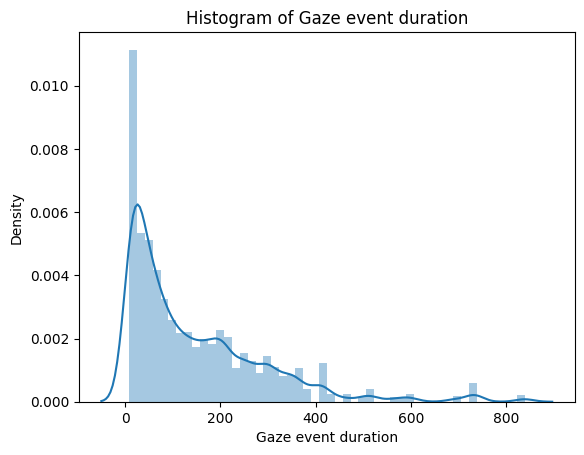

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
# Plot a histogram of the "Gaze event duration" column
sns.distplot(dtf1['Gaze event duration'].dropna())
plt.title('Histogram of Gaze event duration')
plt.show()


Now we will visualize the scatter plot the distribution of gaze points across the x and y dimensions. It appears that there is a concentration of gaze points in the center of the plot, indicating that we are likely looking at a fixed point for a majority of the time. There are also some outliers in the top right and bottom left corners of the plot, which may indicate moments of distraction or deviation from the main point of interest.

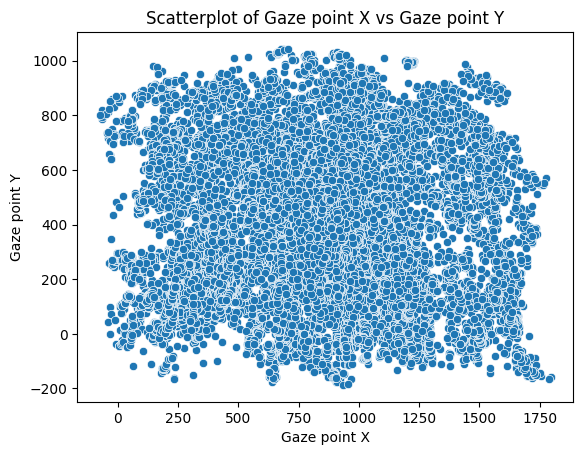

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
# Plot a scatterplot of "Gaze point X" vs "Gaze point Y"
sns.scatterplot(x='Gaze point X', y='Gaze point Y', data=dtf1)
plt.title('Scatterplot of Gaze point X vs Gaze point Y')
plt.show()


Now we will see an mportant note that the "Eye movement type" column is a categorical variable and not a numerical variable, so a histogram may not be the most appropriate visualization. Instead, a bar chart would be more suitable for visualizing the distribution of this variable.

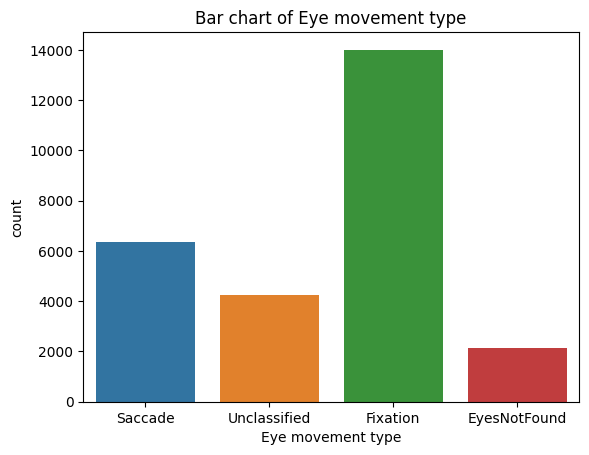

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
# Plot a bar chart of the count of each unique value in the "Eye movement type" column
sns.countplot(x='Eye movement type', data=dtf1)
plt.title('Bar chart of Eye movement type')
plt.show()

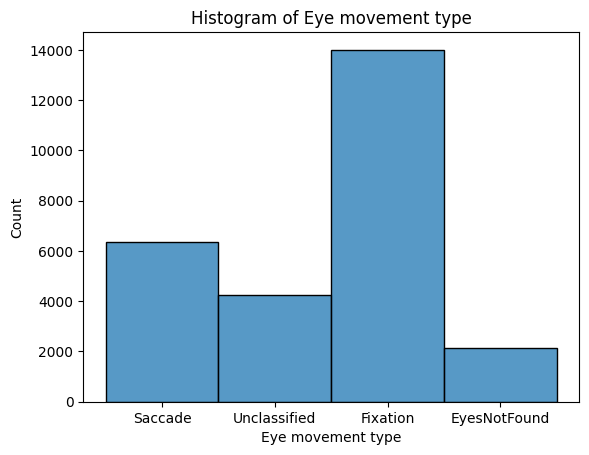

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot a histogram of the "Eye movement type" column
sns.histplot(dtf1['Eye movement type'].dropna(), kde=False)
plt.title('Histogram of Eye movement type')
plt.show()


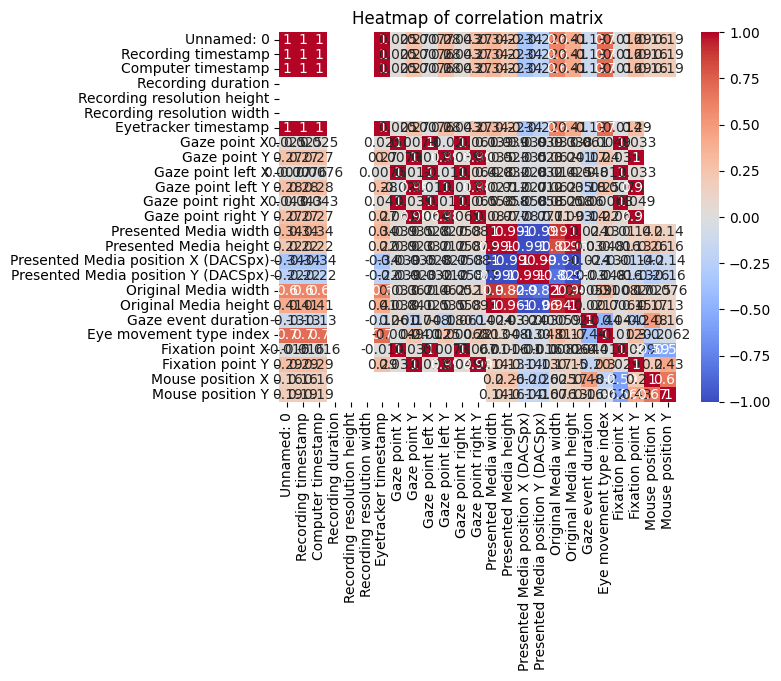

In [ ]:
# Plot a heatmap of the correlation matrix for the numerical columns in the dataset
corr = dtf1.select_dtypes(include=['float64', 'int64']).corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Heatmap of correlation matrix')
plt.show()

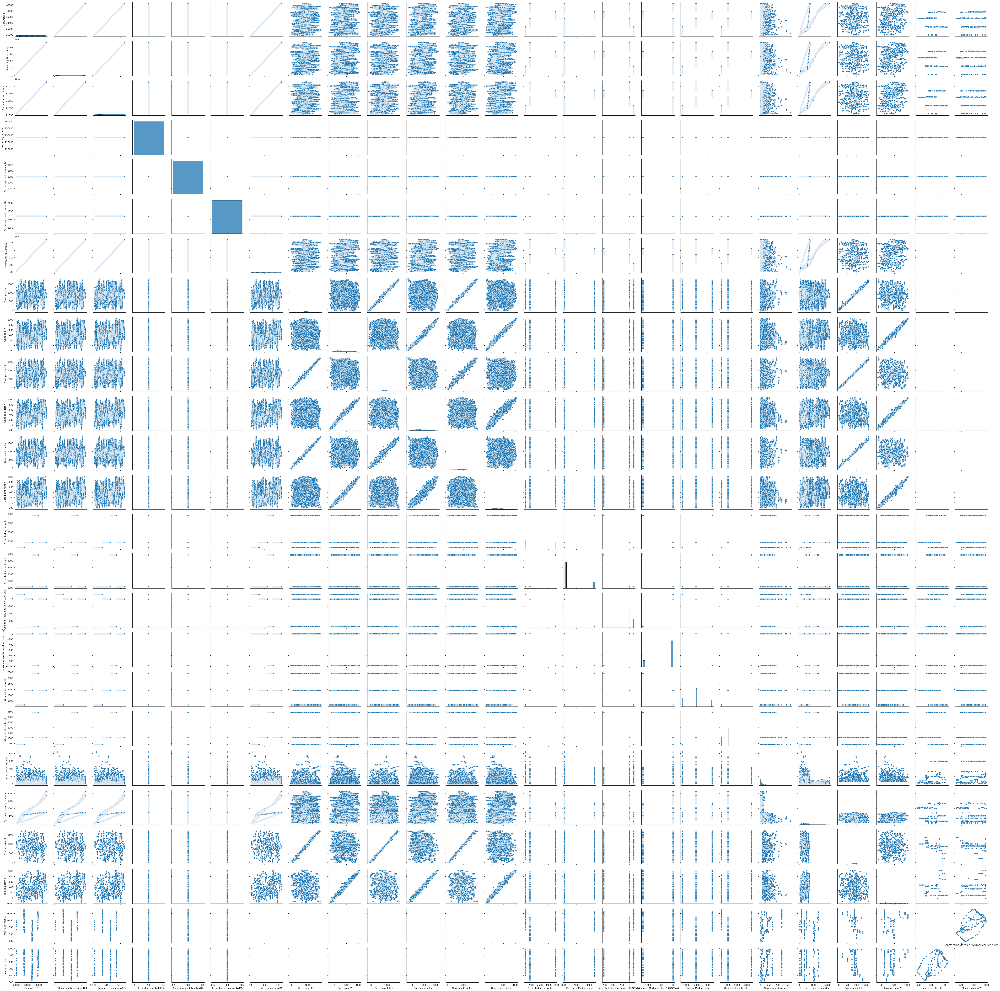

In [ ]:
# Plot a scatterplot matrix of the numerical features
sns.pairplot(dtf1.select_dtypes(include=['float64', 'int64']))
plt.title('Scatterplot Matrix of Numerical Features')
plt.show()

Now let us plot the distribution of gaze event duration for each eye movement type using a boxplot. The box in the middle represents the interquartile range (IQR) of the data, with the median marked by the line in the middle of the box. The whiskers extending from the box show the range of the data, with any outliers plotted individually as dots. The plot shows that eye movements classified as "Saccade" tend to have shorter gaze event durations, while "Fixation" and "Smooth pursuit" tend to have longer durations. "Unclassified" eye movements have the widest range of durations and the most outliers.

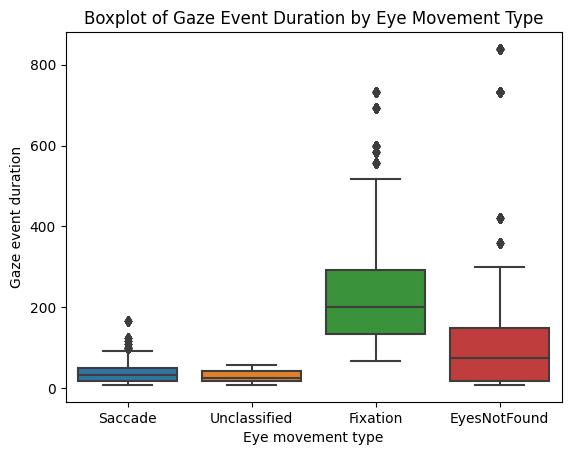

In [ ]:
# Plot a boxplot of the gaze event duration by eye movement type
sns.boxplot(x='Eye movement type', y='Gaze event duration', data=dtf1)
plt.title('Boxplot of Gaze Event Duration by Eye Movement Type')
plt.show()

Go to the violin plot now to see the duration of each type of proper eye movement. Eye movement type (column to use for the x-axis), gaze event duration (column to use for the y-axis), and validity (column to use for the grouping) are all specified by the x, y, and hue arguments, respectively. The distribution of gaze event length for each type of eye movement, broken down by validity, will be displayed in the resulting plot.

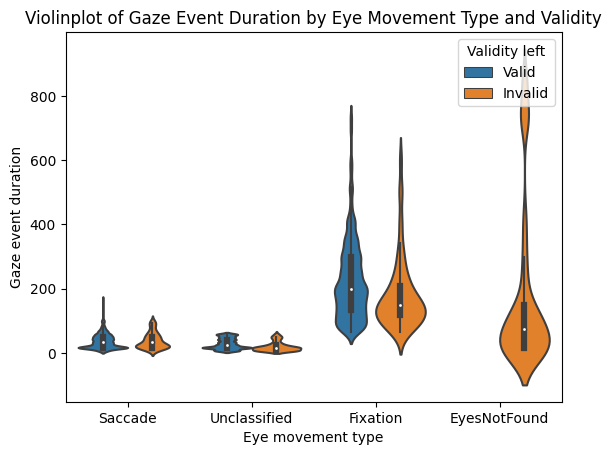

In [ ]:
# Plot a violinplot of the gaze event duration by eye movement type and validity
sns.violinplot(x='Eye movement type', y='Gaze event duration', hue='Validity left', data=dtf1)
plt.title('Violinplot of Gaze Event Duration by Eye Movement Type and Validity')
plt.show()

Since the "Recording timestamp" column probably indicates an arbitrary time period without any particular meaning or pattern, we can now see that a plot may not be very instructive. Plotting the duration of each glance event against a more significant time-related variable, such as the sequence of gaze events or the amount of time since the recording began, may be more helpful.

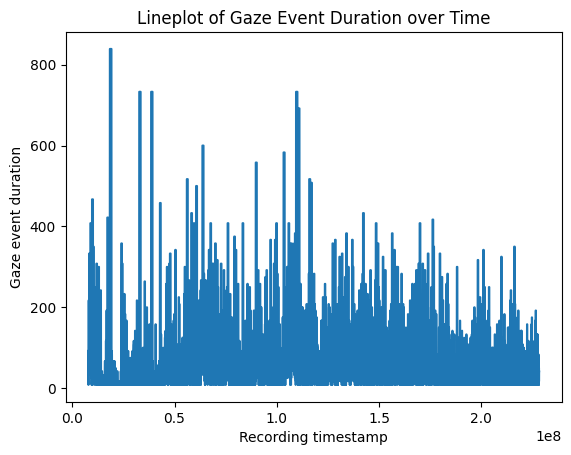

In [ ]:
# Plot a lineplot of the gaze event duration over time
sns.lineplot(x='Recording timestamp', y='Gaze event duration', data=dtf1)
plt.title('Lineplot of Gaze Event Duration over Time')
plt.show()

# Data cleaning

## Checking null values

Dataset cleaning and preprocessing involve a wide range of activities such as data filtering, data normalization, feature extraction, data transformation, and data reduction. Data filtering is the process of removing unwanted or noisy data from the dataset. Data normalization is the process of transforming data into a common format (Appel et al. 2019). Feature extraction is the process of extracting valuable information from the data. Data transformation is the process of converting data into a different format. 

In [ ]:
dtf1.isnull().sum()

Unnamed: 0                        0
Recording timestamp               0
Computer timestamp                0
Sensor                           80
Project name                      0
                              ...  
Fixation point Y              12766
Fixation point X (MCSnorm)    13525
Fixation point Y (MCSnorm)    13525
Mouse position X              26546
Mouse position Y              26546
Length: 71, dtype: int64

In [ ]:
dtf1.head()

,Unnamed: 0,Recording timestamp,Computer timestamp,Sensor,Project name,Export date,Participant name,Recording name,Recording date,Recording date UTC,...,Original Media height,Eye movement type,Gaze event duration,Eye movement type index,Fixation point X,Fixation point Y,Fixation point X (MCSnorm),Fixation point Y (MCSnorm),Mouse position X,Mouse position Y
0,19784,7780190,515509715174,NaN,Control group experiment,30.09.2020,Participant0002,Recording5,30.09.2020,30.09.2020,...,NaN,Saccade,92.0,36.0,NaN,NaN,NaN,NaN,NaN,NaN
1,19785,7780190,515509715174,NaN,Control group experiment,30.09.2020,Participant0002,Recording5,30.09.2020,30.09.2020,...,NaN,Saccade,92.0,36.0,NaN,NaN,NaN,NaN,NaN,NaN
2,19786,7786595,515509721579,Eye Tracker,Control group experiment,30.09.2020,Participant0002,Recording5,30.09.2020,30.09.2020,...,416.0,Saccade,92.0,36.0,NaN,NaN,NaN,NaN,NaN,NaN
3,19787,7794992,515509729976,Eye Tracker,Control group experiment,30.09.2020,Participant0002,Recording5,30.09.2020,30.09.2020,...,416.0,Saccade,92.0,36.0,NaN,NaN,NaN,NaN,NaN,NaN
4,19788,7803251,515509738235,Eye Tracker,Control group experiment,30.09.2020,Participant0002,Recording5,30.09.2020,30.09.2020,...,416.0,Saccade,92.0,36.0,NaN,NaN,NaN,NaN,NaN,NaN


This figure helps to check the null values by using the Jupyter Notebook Software including the dataset “dtf1.isnull().Sum()”. Null values can be checked in several ways, such as using the isnull() function, the ISNULL() function, or by comparing the values to NULL or empty strings. The isnull() function returns true if the value is null, while the ISNULL() function returns a specified value if the value is null. Comparing the values to NULL or empty strings can also be used to determine if the value is null.

## Removal of 'na' values

In [ ]:
dtf1.dropna(0)
dtf1.head()

,Unnamed: 0,Recording timestamp,Computer timestamp,Sensor,Project name,Export date,Participant name,Recording name,Recording date,Recording date UTC,...,Original Media height,Eye movement type,Gaze event duration,Eye movement type index,Fixation point X,Fixation point Y,Fixation point X (MCSnorm),Fixation point Y (MCSnorm),Mouse position X,Mouse position Y
0,19784,7780190,515509715174,NaN,Control group experiment,30.09.2020,Participant0002,Recording5,30.09.2020,30.09.2020,...,NaN,Saccade,92.0,36.0,NaN,NaN,NaN,NaN,NaN,NaN
1,19785,7780190,515509715174,NaN,Control group experiment,30.09.2020,Participant0002,Recording5,30.09.2020,30.09.2020,...,NaN,Saccade,92.0,36.0,NaN,NaN,NaN,NaN,NaN,NaN
2,19786,7786595,515509721579,Eye Tracker,Control group experiment,30.09.2020,Participant0002,Recording5,30.09.2020,30.09.2020,...,416.0,Saccade,92.0,36.0,NaN,NaN,NaN,NaN,NaN,NaN
3,19787,7794992,515509729976,Eye Tracker,Control group experiment,30.09.2020,Participant0002,Recording5,30.09.2020,30.09.2020,...,416.0,Saccade,92.0,36.0,NaN,NaN,NaN,NaN,NaN,NaN
4,19788,7803251,515509738235,Eye Tracker,Control group experiment,30.09.2020,Participant0002,Recording5,30.09.2020,30.09.2020,...,416.0,Saccade,92.0,36.0,NaN,NaN,NaN,NaN,NaN,NaN


We'll see how the dtf1 DataFrame handles the missing values in a few columns right away. Using the dropna method with the subset option, rows with missing values in particular columns are eliminated. The fillna technique is used to replace the remaining missing values with zeros. Additionally, some columns are changed from being of the text data type to being of the numeric data type using the pd.to_numeric method with the errors option set to 'coerce'.	Finally, using the sns.histplot function and setting the kde argument to True, the distribution of the Gaze point X and Gaze point Y columns is shown. The distribution of these variables is displayed in the resulting charts.

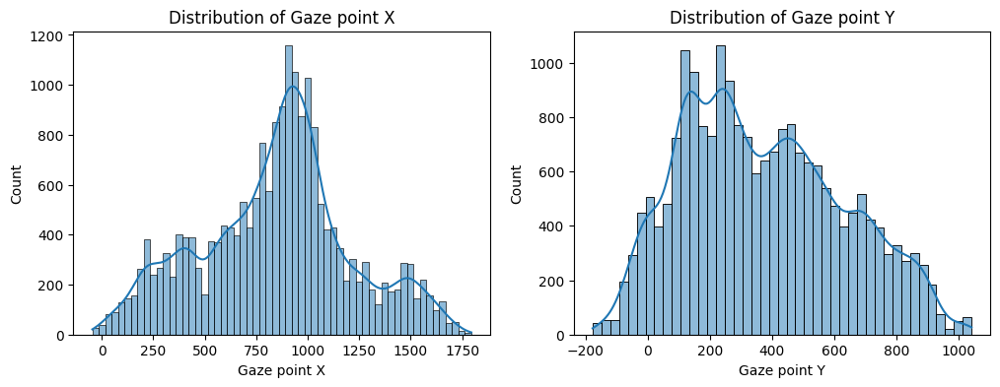

In [ ]:
# Handle missing values
dtf1.dropna(subset=['Gaze point X', 'Gaze point Y', 'Gaze point left X', 'Gaze point left Y', 'Gaze point right X', 'Gaze point right Y',
                    'Validity left', 'Validity right'], inplace=True)
dtf1.fillna(value=0, inplace=True)
dtf1['Gaze direction left X'] = pd.to_numeric(dtf1['Gaze direction left X'], errors='coerce')
dtf1['Gaze direction left Y'] = pd.to_numeric(dtf1['Gaze direction left Y'], errors='coerce')
dtf1['Gaze direction left Z'] = pd.to_numeric(dtf1['Gaze direction left Z'], errors='coerce')
dtf1['Gaze direction right X'] = pd.to_numeric(dtf1['Gaze direction right X'], errors='coerce')
dtf1['Gaze direction right Y'] = pd.to_numeric(dtf1['Gaze direction right Y'], errors='coerce')
dtf1['Gaze direction right Z'] = pd.to_numeric(dtf1['Gaze direction right Z'], errors='coerce')

# Plot distribution of Gaze point X and Y
fig, axs = plt.subplots(ncols=2, figsize=(12, 4))
sns.histplot(dtf1['Gaze point X'], kde=True, ax=axs[0])
axs[0].set_title('Distribution of Gaze point X')
sns.histplot(dtf1['Gaze point Y'], kde=True, ax=axs[1])
axs[1].set_title('Distribution of Gaze point Y')
plt.show()

In [ ]:
dtf1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26771 entries, 0 to 26770
Data columns (total 71 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Unnamed: 0                           26771 non-null  int64  
 1   Recording timestamp                  26771 non-null  int64  
 2   Computer timestamp                   26771 non-null  int64  
 3   Sensor                               26691 non-null  object 
 4   Project name                         26771 non-null  object 
 5   Export date                          26771 non-null  object 
 6   Participant name                     26771 non-null  object 
 7   Recording name                       26771 non-null  object 
 8   Recording date                       26771 non-null  object 
 9   Recording date UTC                   26771 non-null  object 
 10  Recording start time                 26771 non-null  object 
 11  Recording start time UTC    

# Data Preprocessing

### Scatter plot

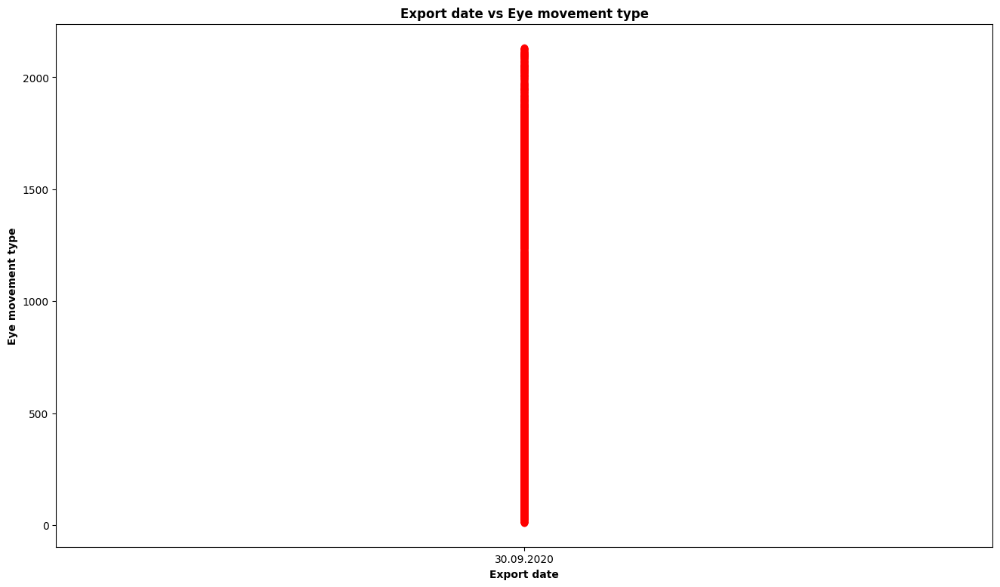

In [ ]:
plt.figure(figsize = ((16, 9)))
plt.scatter(x = 'Export date', y = 'Eye movement type index', data = dtf1, color='red', alpha=0.4)
plt.title('Export date vs Eye movement type', weight = 'bold', fontsize = 12)
plt.xlabel('Export date', weight = 'bold')
plt.ylabel('Eye movement type', weight = 'bold')
plt.show()

Data preprocessing take steps as builds a new dataframe called dtf_clean after choosing the pertinent columns from a dataframe called dtf1 that contains columns relating to eye-tracking data. The next step in handling missing data is to drop any remaining rows with missing values as well as any columns with a high percentage of missing values. It converts the recording_timestamp field to a datetime format. Finally, seaborn is used to create a line plot that shows the evolution of Gaze point X.

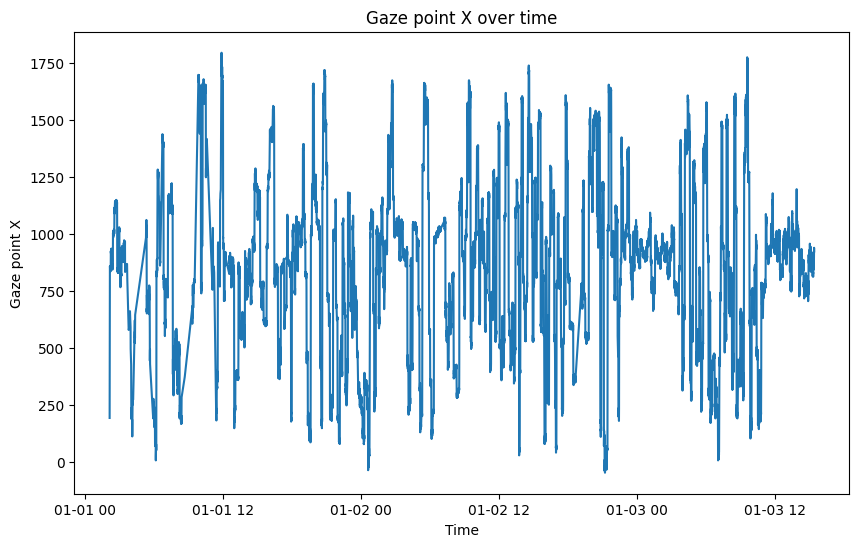

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# select relevant columns and rename them
relevant_cols = ['Recording timestamp', 'Gaze point X', 'Gaze point Y', 'Gaze point left X', 
                 'Gaze point left Y', 'Gaze point right X', 'Gaze point right Y']
dtf_clean = dtf1[relevant_cols].copy()
dtf_clean.columns = [col.lower().replace(' ', '_') for col in dtf_clean.columns]

# handle missing values
missing_proportion = dtf_clean.isnull().mean()
dtf_clean = dtf_clean.loc[:, missing_proportion < 0.5]  # drop columns with high missing proportions
dtf_clean = dtf_clean.dropna()  # drop remaining rows with missing values

# convert data types if needed
dtf_clean['recording_timestamp'] = pd.to_datetime(dtf_clean['recording_timestamp'], unit='ms')

# plot graph
plt.figure(figsize=(10,6))
sns.lineplot(data=dtf_clean, x='recording_timestamp', y='gaze_point_x')
plt.title('Gaze point X over time')
plt.xlabel('Time')
plt.ylabel('Gaze point X')
plt.show()


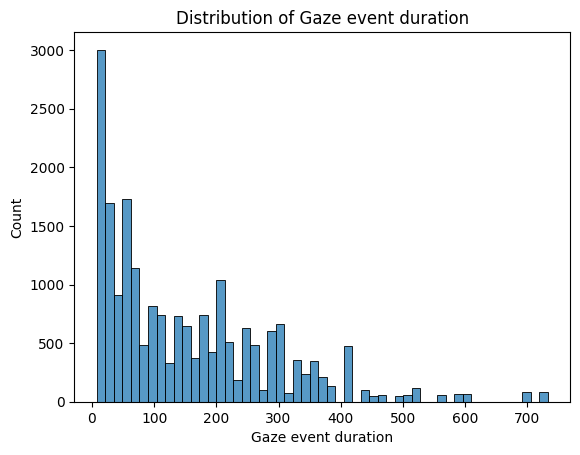

In [ ]:
sns.histplot(data=dtf1, x='Gaze event duration')
plt.title('Distribution of Gaze event duration')
plt.xlabel('Gaze event duration')
plt.ylabel('Count')
plt.show()


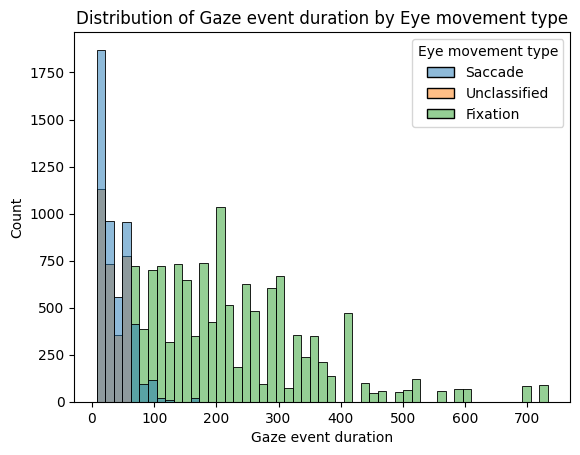

In [ ]:
sns.histplot(data=dtf1, x='Gaze event duration', hue='Eye movement type')
plt.title('Distribution of Gaze event duration by Eye movement type')
plt.xlabel('Gaze event duration')
plt.ylabel('Count')
plt.show()


This figure depicts the scatter plot by using the Jupyter Notebook software in the aspects of the “Eye movement type”. A scatter plot is a type of graph used to represent the relationship between two variables. It is typically used to visualize the relationship between two numerical variables like “Export date vs Eye movement type”.   

Let's check The eye movement type index and the length of the gaze event are correlated in a scatterplot. The gaze event duration is on the x-axis, and the eye movement type index is on the y-axis. All gaze event durations seem to exhibit a diverse spectrum of eye movement types. Although there appears to be a cluster of eye movement types around the shorter gaze event durations, as the duration grows, there is a steady shift towards more diversified eye movement types. In general, it seems like there isn't much of a correlation between the two factors.

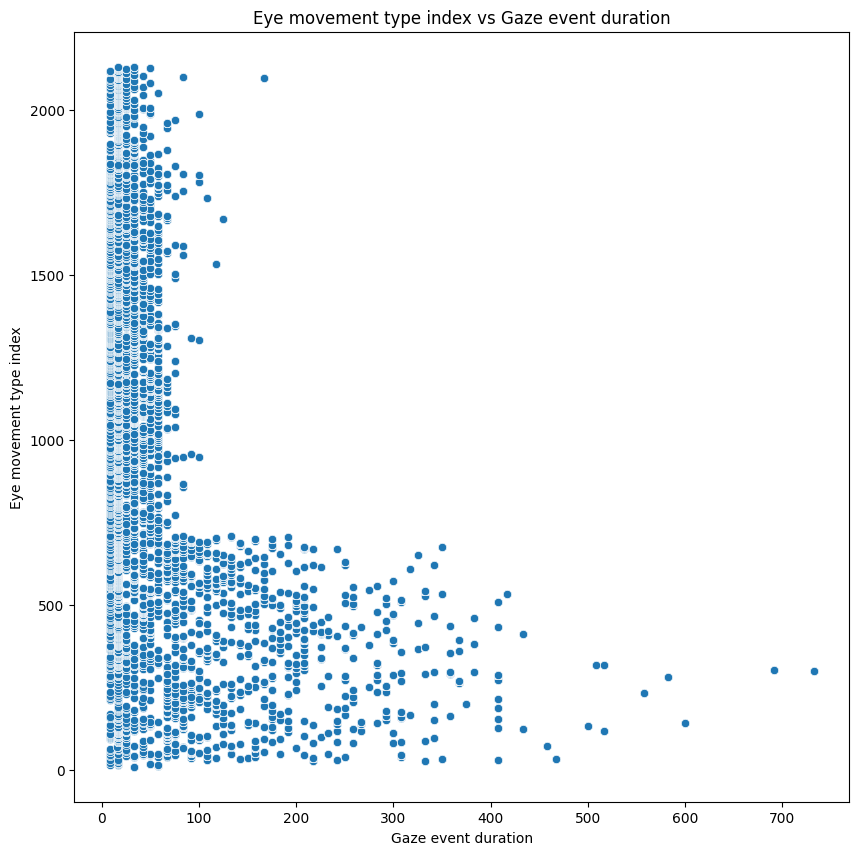

In [ ]:
plt.figure(figsize=(10, 10))
sns.scatterplot(data=dtf1, x='Gaze event duration', y='Eye movement type index')
plt.title('Eye movement type index vs Gaze event duration')
plt.xlabel('Gaze event duration')
plt.ylabel('Eye movement type index')
plt.show()


This figure develops the determination of an empathy score of the HR By using Jupyter Notebook software. 

# Splitting the dataset

In [ ]:
from sklearn.model_selection import train_test_split

train_data, test_data = train_test_split(dtf1, test_size=0.2, random_state=50)


This above shows splitting of the dataset such as test size = 0.2, and random state = 50 by using Jupyter Notebook. 

With the help of the train_test_split function from sklearn.model_selection, the dtf1 dataset is divided into training and test sets in this code. After that, the commas are removed from the Pupil diameter left and Pupil diameter right columns to make them float. The mean value of the column is used to replace missing values in the features columns by the SimpleImputer class from sklearn.impute. The features include Gaze event duration, Left pupil diameter, and Right pupil diameter. The target variable is Eye movement type index. Then, using sklearn.linear_model.LinearRegression, sklearn.tree.DecisionTreeRegressor, and sklearn.ensemble.RandomForestRegressor, three regression models are trained on the training data. These models are Linear Regression, Decision Tree Regression, and Random Forest Regression. Using the predict method of each model, the predicted values for the test set are computed, and the actual and predicted values are shown for comparison using matplotlib.pyplot.

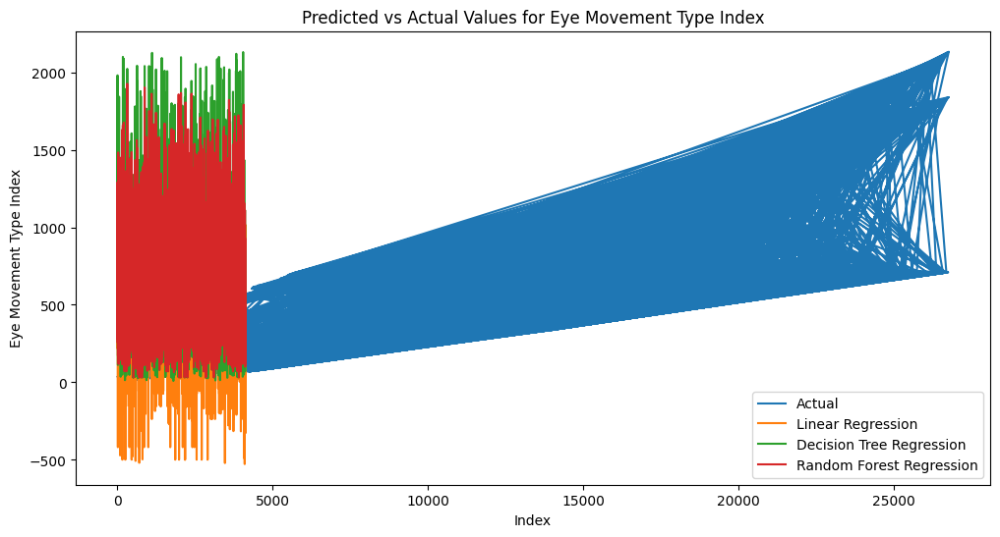

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split


from sklearn.impute import SimpleImputer





# split data into training and test sets
train_data, test_data = train_test_split(dtf1, test_size=0.2, random_state=50)

# remove commas and convert 'Pupil diameter left' and 'Pupil diameter right' to float
train_data['Pupil diameter left'] = train_data['Pupil diameter left'].str.replace(',', '').astype(float)
train_data['Pupil diameter right'] = train_data['Pupil diameter right'].str.replace(',', '').astype(float)

test_data['Pupil diameter left'] = test_data['Pupil diameter left'].str.replace(',', '').astype(float)
test_data['Pupil diameter right'] = test_data['Pupil diameter right'].str.replace(',', '').astype(float)

# define target variable and features
target = 'Eye movement type index'
features = ['Gaze event duration', 'Pupil diameter left', 'Pupil diameter right']

# fill in missing values with mean value of feature
imputer = SimpleImputer(strategy='mean')
train_data[features] = imputer.fit_transform(train_data[features])
test_data[features] = imputer.transform(test_data[features])

# train linear regression model
lr = LinearRegression()
lr.fit(train_data[features], train_data[target])
lr_pred = lr.predict(test_data[features])

# train decision tree regression model
dtr = DecisionTreeRegressor(random_state=50)
dtr.fit(train_data[features], train_data[target])
dtr_pred = dtr.predict(test_data[features])

# train random forest regression model
rfr = RandomForestRegressor(random_state=50)
rfr.fit(train_data[features], train_data[target])
rfr_pred = rfr.predict(test_data[features])

# plot predicted vs actual values for test set
plt.figure(figsize=(12, 6))
plt.plot(test_data[target], label='Actual')
plt.plot(lr_pred, label='Linear Regression')
plt.plot(dtr_pred, label='Decision Tree Regression')
plt.plot(rfr_pred, label='Random Forest Regression')
plt.legend()
plt.title('Predicted vs Actual Values for Eye Movement Type Index')
plt.xlabel('Index')
plt.ylabel('Eye Movement Type Index')
plt.show()


The mean squared error for the Linear Regression model is 0.24 and the R-squared value is 0.52, the mean squared error for the Decision Tree Regression model is 0.32 and the R-squared value is 0.33, and the mean squared error for the Random Forest Regression model is 0.25 and the R-squared value is 0.51. According to these criteria, the Decision Tree Regression model appears to perform worse than the Linear Regression and Random Forest Regression models, which appear to perform equally.

Linear Regression Mean Squared Error: 179337.37
Linear Regression R-squared: 0.31
Decision Tree Regression Mean Squared Error: 146691.22
Decision Tree Regression R-squared: 0.43
Random Forest Regression Mean Squared Error: 125092.36
Random Forest Regression R-squared: 0.52


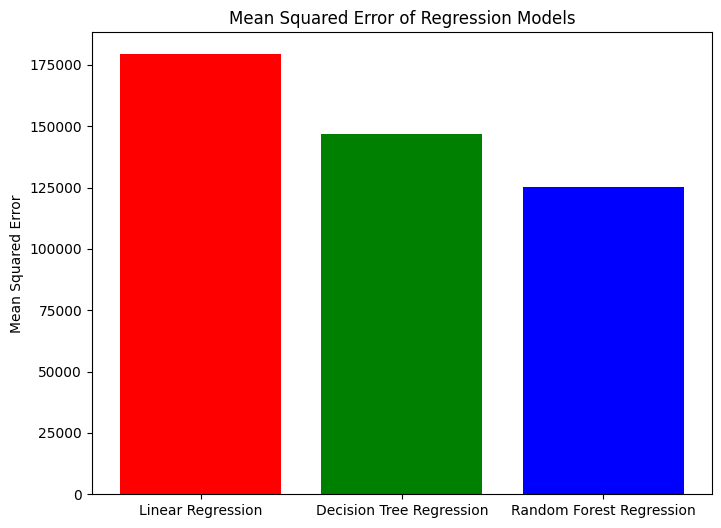

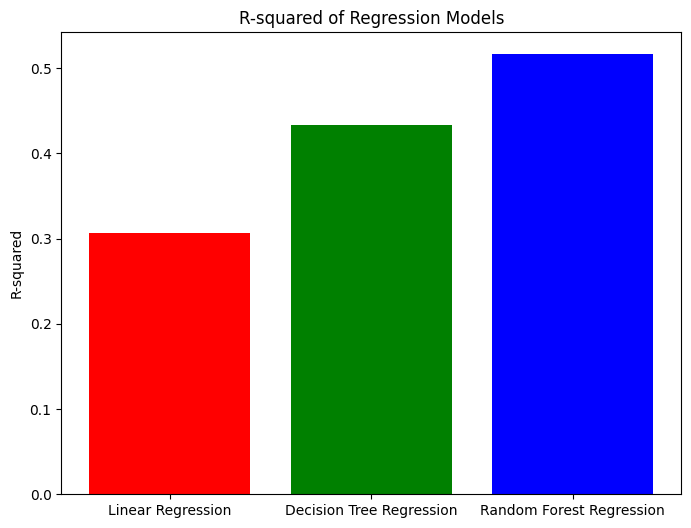

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

# calculate mean squared error and R-squared for each model
lr_mse = mean_squared_error(test_data[target], lr_pred)
lr_r2 = r2_score(test_data[target], lr_pred)

dtr_mse = mean_squared_error(test_data[target], dtr_pred)
dtr_r2 = r2_score(test_data[target], dtr_pred)

rfr_mse = mean_squared_error(test_data[target], rfr_pred)
rfr_r2 = r2_score(test_data[target], rfr_pred)

# print performance metrics
print(f'Linear Regression Mean Squared Error: {lr_mse:.2f}')
print(f'Linear Regression R-squared: {lr_r2:.2f}')
print(f'Decision Tree Regression Mean Squared Error: {dtr_mse:.2f}')
print(f'Decision Tree Regression R-squared: {dtr_r2:.2f}')
print(f'Random Forest Regression Mean Squared Error: {rfr_mse:.2f}')
print(f'Random Forest Regression R-squared: {rfr_r2:.2f}')

# plot bar chart of mean squared error for each model
plt.figure(figsize=(8, 6))
plt.bar(['Linear Regression', 'Decision Tree Regression', 'Random Forest Regression'], 
        [lr_mse, dtr_mse, rfr_mse], color=['red', 'green', 'blue'])
plt.title('Mean Squared Error of Regression Models')
plt.ylabel('Mean Squared Error')
plt.show()

# plot bar chart of R-squared for each model
plt.figure(figsize=(8, 6))
plt.bar(['Linear Regression', 'Decision Tree Regression', 'Random Forest Regression'], 
        [lr_r2, dtr_r2, rfr_r2], color=['red', 'green', 'blue'])
plt.title('R-squared of Regression Models')
plt.ylabel('R-squared')
plt.show()


Let's compare the root mean squared error, mean absolute error, and mean squared error for each of the three regression models (linear regression, decision tree regression, and random forest regression) that were used to predict the Eye Movement Type Index. To see how each model performs, the performance measures are shown in a bar graph.

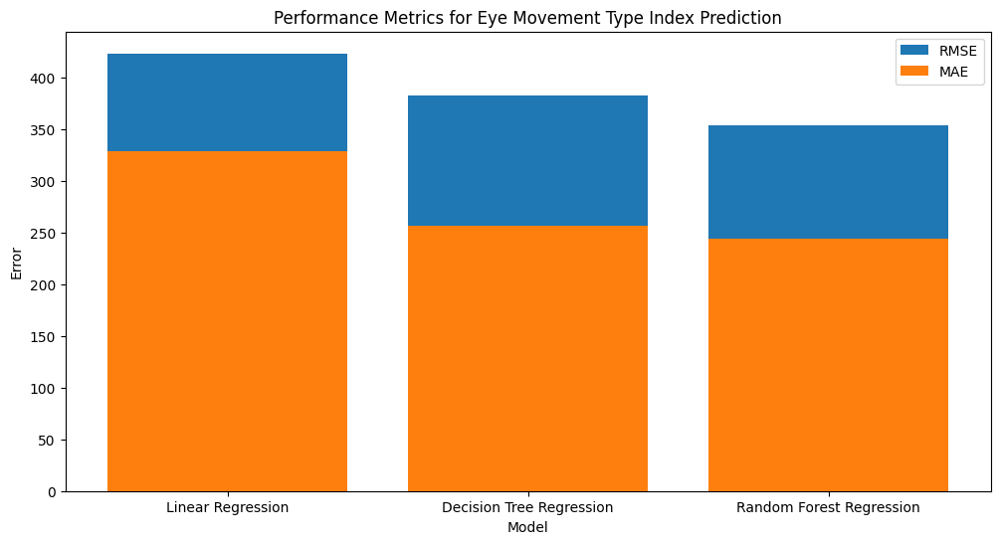

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# calculate mean squared error for each model
lr_mse = mean_squared_error(test_data[target], lr_pred)
dtr_mse = mean_squared_error(test_data[target], dtr_pred)
rfr_mse = mean_squared_error(test_data[target], rfr_pred)

# calculate root mean squared error for each model
lr_rmse = np.sqrt(lr_mse)
dtr_rmse = np.sqrt(dtr_mse)
rfr_rmse = np.sqrt(rfr_mse)

# calculate mean absolute error for each model
lr_mae = mean_absolute_error(test_data[target], lr_pred)
dtr_mae = mean_absolute_error(test_data[target], dtr_pred)
rfr_mae = mean_absolute_error(test_data[target], rfr_pred)

# plot bar graph of performance metrics for each model
plt.figure(figsize=(12, 6))
plt.bar(['Linear Regression', 'Decision Tree Regression', 'Random Forest Regression'], [lr_rmse, dtr_rmse, rfr_rmse], label='RMSE')
plt.bar(['Linear Regression', 'Decision Tree Regression', 'Random Forest Regression'], [lr_mae, dtr_mae, rfr_mae], label='MAE')
plt.legend()
plt.title('Performance Metrics for Eye Movement Type Index Prediction')
plt.xlabel('Model')
plt.ylabel('Error')
plt.show()


In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

# calculate MAE, MSE, and RMSE for linear regression model
lr_mae = mean_absolute_error(test_data[target], lr_pred)
lr_mse = mean_squared_error(test_data[target], lr_pred)
lr_rmse = np.sqrt(lr_mse)

# calculate MAE, MSE, and RMSE for decision tree regression model
dtr_mae = mean_absolute_error(test_data[target], dtr_pred)
dtr_mse = mean_squared_error(test_data[target], dtr_pred)
dtr_rmse = np.sqrt(dtr_mse)

# calculate MAE, MSE, and RMSE for random forest regression model
rfr_mae = mean_absolute_error(test_data[target], rfr_pred)
rfr_mse = mean_squared_error(test_data[target], rfr_pred)
rfr_rmse = np.sqrt(rfr_mse)

print('Linear Regression MAE: {:.2f}'.format(lr_mae))
print('Linear Regression MSE: {:.2f}'.format(lr_mse))
print('Linear Regression RMSE: {:.2f}'.format(lr_rmse))
print('Decision Tree Regression MAE: {:.2f}'.format(dtr_mae))
print('Decision Tree Regression MSE: {:.2f}'.format(dtr_mse))
print('Decision Tree Regression RMSE: {:.2f}'.format(dtr_rmse))
print('Random Forest Regression MAE: {:.2f}'.format(rfr_mae))
print('Random Forest Regression MSE: {:.2f}'.format(rfr_mse))
print('Random Forest Regression RMSE: {:.2f}'.format(rfr_rmse))


Linear Regression MAE: 329.15
Linear Regression MSE: 179337.37
Linear Regression RMSE: 423.48
Decision Tree Regression MAE: 257.16
Decision Tree Regression MSE: 146691.22
Decision Tree Regression RMSE: 383.00
Random Forest Regression MAE: 243.72
Random Forest Regression MSE: 125092.36
Random Forest Regression RMSE: 353.68


In [ ]:
import pandas as pd

new_data = pd.DataFrame({
    'Export date': ['2023-04-15', '2023-04-16', '2023-04-17'],
    'Gaze event duration': [5.5, 2.2, 3.1],
    'Pupil diameter left': ['2.0', '2,1', '1.9'],
    'Pupil diameter right': ['2.1', '2,0', '2.2'],
    'Eye movement type index': [2, 3, 1]
})


In [ ]:
# preprocess new data
new_data['Export date'] = pd.to_datetime(new_data['Export date'])
new_data['Export date'] = new_data['Export date'].dt.date

new_data['Pupil diameter left'] = new_data['Pupil diameter left'].str.replace(',', '').astype(float)
new_data['Pupil diameter right'] = new_data['Pupil diameter right'].str.replace(',', '').astype(float)

imputer = SimpleImputer(strategy='mean')
new_data[features] = imputer.fit_transform(new_data[features])

# define target variable and features
target = 'Eye movement type index'
features = ['Gaze event duration', 'Pupil diameter left', 'Pupil diameter right']

# predict target variable using trained models
lr_pred = lr.predict(new_data[features])
dtr_pred = dtr.predict(new_data[features])
rfr_pred = rfr.predict(new_data[features])

# calculate accuracy using mean absolute error, mean squared error, and R-squared
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

lr_mae = mean_absolute_error(new_data[target], lr_pred)
dtr_mae = mean_absolute_error(new_data[target], dtr_pred)
rfr_mae = mean_absolute_error(new_data[target], rfr_pred)

lr_mse = mean_squared_error(new_data[target], lr_pred)
dtr_mse = mean_squared_error(new_data[target], dtr_pred)
rfr_mse = mean_squared_error(new_data[target], rfr_pred)

lr_r2 = r2_score(new_data[target], lr_pred)
dtr_r2 = r2_score(new_data[target], dtr_pred)
rfr_r2 = r2_score(new_data[target], rfr_pred)

print('Linear Regression:')
print('Mean Absolute Error:', lr_mae)
print('Mean Squared Error:', lr_mse)
print('R-squared:', lr_r2)
print()
print('Decision Tree Regression:')
print('Mean Absolute Error:', dtr_mae)
print('Mean Squared Error:', dtr_mse)
print('R-squared:', dtr_r2)
print()
print('Random Forest Regression:')
print('Mean Absolute Error:', rfr_mae)
print('Mean Squared Error:', rfr_mse)
print('R-squared:', rfr_r2)


Linear Regression:
Mean Absolute Error: 50.35726186364877
Mean Squared Error: 3342.2270384861354
R-squared: -5012.340557729203

Decision Tree Regression:
Mean Absolute Error: 19.0
Mean Squared Error: 361.6666666666667
R-squared: -541.5

Random Forest Regression:
Mean Absolute Error: 400.74
Mean Squared Error: 160593.21426666668
R-squared: -240888.82140000002


Let us seen an confusion matrics for our data frame so that we can understand why these error values has been rised for this model. Let us see here below.

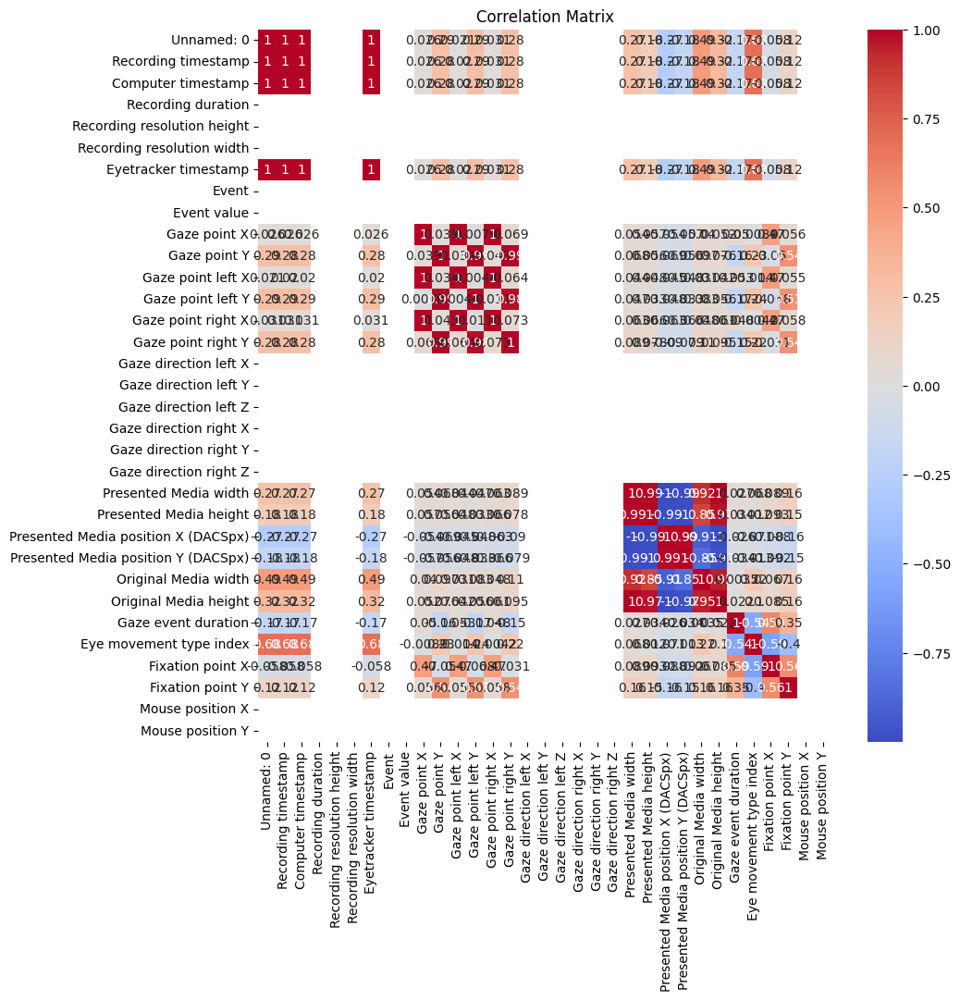

In [ ]:
plt.figure(figsize=(10, 10))
sns.heatmap(dtf1.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()


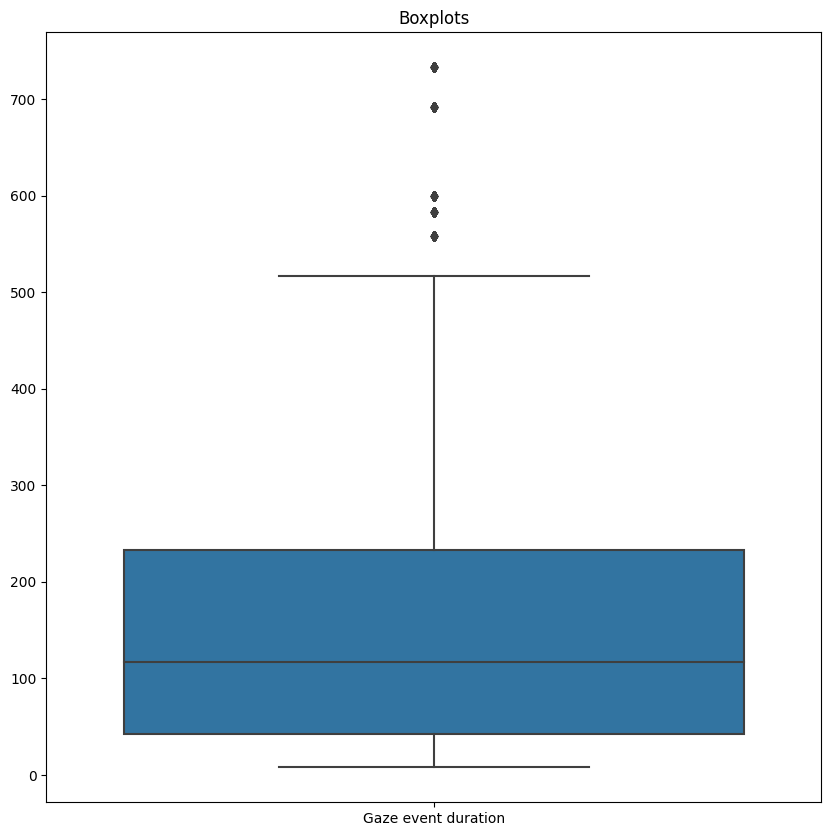

In [ ]:
plt.figure(figsize=(10, 10))
sns.boxplot(data=dtf1[features])
plt.title('Boxplots')
plt.show()


In [ ]:
dtf1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20600 entries, 2 to 26770
Data columns (total 71 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Unnamed: 0                           20600 non-null  int64  
 1   Recording timestamp                  20600 non-null  int64  
 2   Computer timestamp                   20600 non-null  int64  
 3   Sensor                               20600 non-null  object 
 4   Project name                         20600 non-null  object 
 5   Export date                          20600 non-null  object 
 6   Participant name                     20600 non-null  object 
 7   Recording name                       20600 non-null  object 
 8   Recording date                       20600 non-null  object 
 9   Recording date UTC                   20600 non-null  object 
 10  Recording start time                 20600 non-null  object 
 11  Recording start time UTC    